# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:09<00:00, 6.11KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

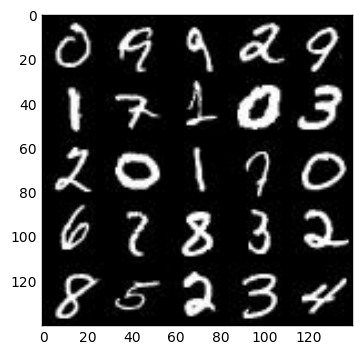

In [40]:
data_dir = './data'
import helper
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

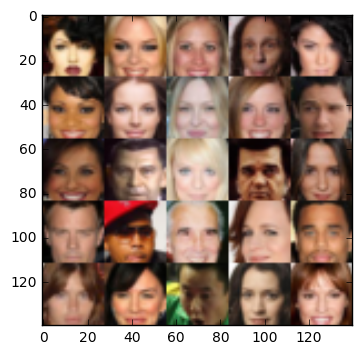

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [22]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_image = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels))
    z_image = tf.placeholder(tf.float32, shape=(None,z_dim)) 
    learning_rate = tf.placeholder(tf.float32)
    return input_image, z_image, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [23]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha = 0.2
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [27]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    # Lot of inspiration of all below codes from dcgan noteboook 
    # https://github.com/udacity/deep-learning/blob/master/dcgan-svhn/DCGAN.ipynb
    with tf.variable_scope('generator', reuse=not is_train):
        alpha = 0.2 
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # print(x1.get_shape().as_list())
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # print(x1.get_shape().as_list())
        # 2x2x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # print(x2.get_shape().as_list())
        # 7x7x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # print(x3.get_shape().as_list())
        # 14x14x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x5 now
        # print(logits.get_shape().as_list())
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [34]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [35]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in ops if opt.name.startswith('generator')]
    
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [36]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [37]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    # model_inputs(image_width, image_height, image_channels, z_dim)
             
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], 
                                                      data_shape[3], z_dim)
    out_channel_dim = data_shape[3]
    d_loss, g_loss = model_loss(input_real, input_z,
                                out_channel_dim)

    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0 
    n_images = 25
    losses = [] 
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images *= 2.0 
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, lr: learning_rate}) 
                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % 100 == 0:
                    show_generator_output(sess, n_images, input_z, out_channel_dim, data_image_mode)
                    
                    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.2429... Generator Loss: 2.0282
Epoch 1/2... Discriminator Loss: 0.2323... Generator Loss: 1.7567
Epoch 1/2... Discriminator Loss: 0.3368... Generator Loss: 1.4654
Epoch 1/2... Discriminator Loss: 0.0962... Generator Loss: 12.3797
Epoch 1/2... Discriminator Loss: 0.1938... Generator Loss: 8.0260
Epoch 1/2... Discriminator Loss: 0.1217... Generator Loss: 3.5374
Epoch 1/2... Discriminator Loss: 0.3990... Generator Loss: 1.1973
Epoch 1/2... Discriminator Loss: 0.1917... Generator Loss: 2.7796
Epoch 1/2... Discriminator Loss: 2.7713... Generator Loss: 0.0971
Epoch 1/2... Discriminator Loss: 0.4488... Generator Loss: 3.8127


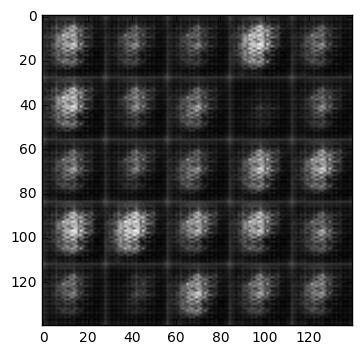

Epoch 1/2... Discriminator Loss: 0.2876... Generator Loss: 2.5112
Epoch 1/2... Discriminator Loss: 0.1840... Generator Loss: 2.9068
Epoch 1/2... Discriminator Loss: 0.1456... Generator Loss: 3.1185
Epoch 1/2... Discriminator Loss: 0.2425... Generator Loss: 2.1336
Epoch 1/2... Discriminator Loss: 0.1649... Generator Loss: 2.6460
Epoch 1/2... Discriminator Loss: 0.2752... Generator Loss: 2.1657
Epoch 1/2... Discriminator Loss: 0.1744... Generator Loss: 2.3380
Epoch 1/2... Discriminator Loss: 0.1230... Generator Loss: 3.2956
Epoch 1/2... Discriminator Loss: 0.0648... Generator Loss: 3.4770
Epoch 1/2... Discriminator Loss: 0.0832... Generator Loss: 4.1096


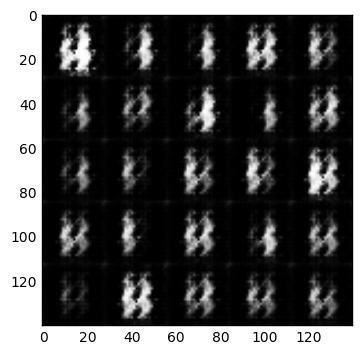

Epoch 1/2... Discriminator Loss: 0.0889... Generator Loss: 3.5212
Epoch 1/2... Discriminator Loss: 0.1135... Generator Loss: 3.1714
Epoch 1/2... Discriminator Loss: 0.1775... Generator Loss: 3.2268
Epoch 1/2... Discriminator Loss: 0.0656... Generator Loss: 6.1971
Epoch 1/2... Discriminator Loss: 0.2148... Generator Loss: 2.8568
Epoch 1/2... Discriminator Loss: 0.2521... Generator Loss: 2.8670
Epoch 1/2... Discriminator Loss: 0.1122... Generator Loss: 4.2282
Epoch 1/2... Discriminator Loss: 0.1749... Generator Loss: 2.7145
Epoch 1/2... Discriminator Loss: 0.2883... Generator Loss: 2.1965
Epoch 1/2... Discriminator Loss: 0.2293... Generator Loss: 2.6922


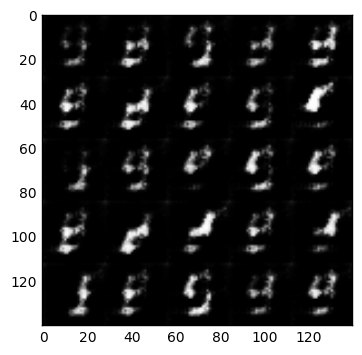

Epoch 1/2... Discriminator Loss: 0.1316... Generator Loss: 3.1064
Epoch 1/2... Discriminator Loss: 0.1997... Generator Loss: 2.5342
Epoch 1/2... Discriminator Loss: 0.1781... Generator Loss: 2.5556
Epoch 1/2... Discriminator Loss: 0.1824... Generator Loss: 3.9909
Epoch 1/2... Discriminator Loss: 0.2007... Generator Loss: 2.7371
Epoch 1/2... Discriminator Loss: 0.2600... Generator Loss: 2.4165
Epoch 1/2... Discriminator Loss: 0.2747... Generator Loss: 2.5136
Epoch 1/2... Discriminator Loss: 0.1064... Generator Loss: 3.7901
Epoch 1/2... Discriminator Loss: 0.4556... Generator Loss: 2.3914
Epoch 1/2... Discriminator Loss: 0.4087... Generator Loss: 4.7451


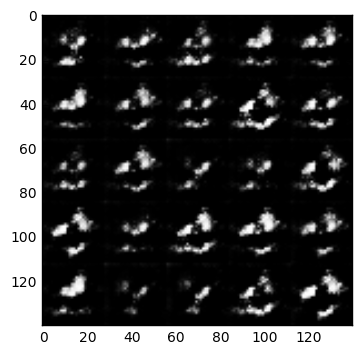

Epoch 1/2... Discriminator Loss: 0.4883... Generator Loss: 1.9206
Epoch 1/2... Discriminator Loss: 0.1956... Generator Loss: 3.4130
Epoch 1/2... Discriminator Loss: 0.3239... Generator Loss: 2.8207
Epoch 1/2... Discriminator Loss: 0.2631... Generator Loss: 2.4106
Epoch 1/2... Discriminator Loss: 0.5021... Generator Loss: 1.6615
Epoch 1/2... Discriminator Loss: 0.2189... Generator Loss: 2.3608
Epoch 1/2... Discriminator Loss: 0.6373... Generator Loss: 6.4199
Epoch 1/2... Discriminator Loss: 0.2228... Generator Loss: 3.5257
Epoch 1/2... Discriminator Loss: 0.2002... Generator Loss: 2.5636
Epoch 1/2... Discriminator Loss: 0.2598... Generator Loss: 2.6802


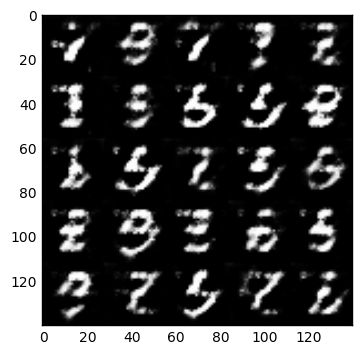

Epoch 1/2... Discriminator Loss: 0.1674... Generator Loss: 3.2370
Epoch 1/2... Discriminator Loss: 0.2473... Generator Loss: 2.4363
Epoch 1/2... Discriminator Loss: 0.3008... Generator Loss: 2.1098
Epoch 1/2... Discriminator Loss: 0.5454... Generator Loss: 1.7023
Epoch 1/2... Discriminator Loss: 0.3574... Generator Loss: 2.2239
Epoch 1/2... Discriminator Loss: 0.4190... Generator Loss: 3.1660
Epoch 1/2... Discriminator Loss: 0.6241... Generator Loss: 3.3042
Epoch 1/2... Discriminator Loss: 0.4244... Generator Loss: 2.5365
Epoch 1/2... Discriminator Loss: 0.8145... Generator Loss: 3.4483
Epoch 1/2... Discriminator Loss: 0.4017... Generator Loss: 2.5078


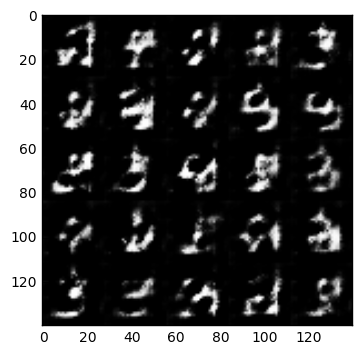

Epoch 1/2... Discriminator Loss: 0.5254... Generator Loss: 1.6805
Epoch 1/2... Discriminator Loss: 0.4475... Generator Loss: 1.6954
Epoch 1/2... Discriminator Loss: 0.3427... Generator Loss: 2.7517
Epoch 1/2... Discriminator Loss: 0.6169... Generator Loss: 1.6782
Epoch 1/2... Discriminator Loss: 0.3969... Generator Loss: 1.9442
Epoch 1/2... Discriminator Loss: 0.8442... Generator Loss: 0.8457
Epoch 1/2... Discriminator Loss: 0.7591... Generator Loss: 3.4247
Epoch 1/2... Discriminator Loss: 0.5808... Generator Loss: 2.3739
Epoch 1/2... Discriminator Loss: 0.4674... Generator Loss: 1.8803
Epoch 1/2... Discriminator Loss: 0.3639... Generator Loss: 2.0974


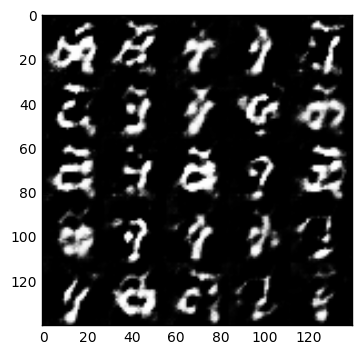

Epoch 1/2... Discriminator Loss: 0.4938... Generator Loss: 2.2604
Epoch 1/2... Discriminator Loss: 0.4547... Generator Loss: 2.6285
Epoch 1/2... Discriminator Loss: 0.9326... Generator Loss: 3.4014
Epoch 1/2... Discriminator Loss: 0.4028... Generator Loss: 2.3690
Epoch 1/2... Discriminator Loss: 0.7450... Generator Loss: 1.1587
Epoch 1/2... Discriminator Loss: 0.4531... Generator Loss: 2.0753
Epoch 1/2... Discriminator Loss: 0.5746... Generator Loss: 3.2481
Epoch 1/2... Discriminator Loss: 0.9961... Generator Loss: 0.8620
Epoch 1/2... Discriminator Loss: 0.6610... Generator Loss: 1.1166
Epoch 1/2... Discriminator Loss: 1.0882... Generator Loss: 0.6290


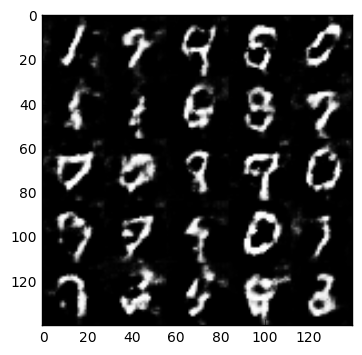

Epoch 1/2... Discriminator Loss: 0.6398... Generator Loss: 2.6000
Epoch 1/2... Discriminator Loss: 0.6771... Generator Loss: 1.3363
Epoch 1/2... Discriminator Loss: 0.3818... Generator Loss: 2.4598
Epoch 1/2... Discriminator Loss: 0.6420... Generator Loss: 2.5235
Epoch 1/2... Discriminator Loss: 0.6225... Generator Loss: 1.3958
Epoch 1/2... Discriminator Loss: 0.8742... Generator Loss: 0.8721
Epoch 1/2... Discriminator Loss: 0.6748... Generator Loss: 1.4011
Epoch 1/2... Discriminator Loss: 0.6350... Generator Loss: 1.1640
Epoch 1/2... Discriminator Loss: 1.4657... Generator Loss: 3.8212
Epoch 1/2... Discriminator Loss: 0.8253... Generator Loss: 0.9214


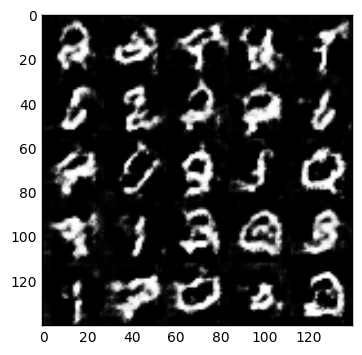

Epoch 1/2... Discriminator Loss: 0.8531... Generator Loss: 0.8657
Epoch 1/2... Discriminator Loss: 0.4956... Generator Loss: 1.5606
Epoch 1/2... Discriminator Loss: 0.5262... Generator Loss: 1.5881
Epoch 2/2... Discriminator Loss: 0.6889... Generator Loss: 1.1099
Epoch 2/2... Discriminator Loss: 1.2229... Generator Loss: 4.0188
Epoch 2/2... Discriminator Loss: 0.6998... Generator Loss: 1.3422
Epoch 2/2... Discriminator Loss: 0.5644... Generator Loss: 2.3401
Epoch 2/2... Discriminator Loss: 0.5700... Generator Loss: 1.5805
Epoch 2/2... Discriminator Loss: 0.7921... Generator Loss: 0.8936
Epoch 2/2... Discriminator Loss: 0.7220... Generator Loss: 2.2157


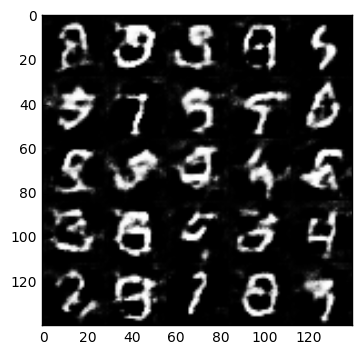

Epoch 2/2... Discriminator Loss: 0.5690... Generator Loss: 1.2509
Epoch 2/2... Discriminator Loss: 0.5686... Generator Loss: 1.5489
Epoch 2/2... Discriminator Loss: 0.8404... Generator Loss: 0.9236
Epoch 2/2... Discriminator Loss: 0.4871... Generator Loss: 1.7062
Epoch 2/2... Discriminator Loss: 0.5270... Generator Loss: 1.6490
Epoch 2/2... Discriminator Loss: 0.6006... Generator Loss: 1.7605
Epoch 2/2... Discriminator Loss: 0.4652... Generator Loss: 1.8743
Epoch 2/2... Discriminator Loss: 0.7651... Generator Loss: 0.9580
Epoch 2/2... Discriminator Loss: 0.5488... Generator Loss: 1.4791
Epoch 2/2... Discriminator Loss: 0.5407... Generator Loss: 1.9458


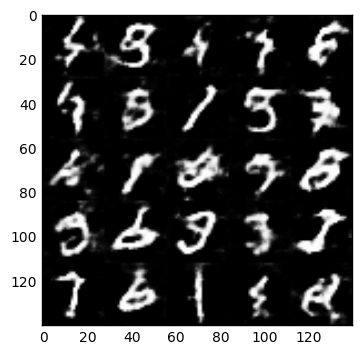

Epoch 2/2... Discriminator Loss: 0.6158... Generator Loss: 1.2474
Epoch 2/2... Discriminator Loss: 1.1781... Generator Loss: 3.1546
Epoch 2/2... Discriminator Loss: 0.9717... Generator Loss: 0.8245
Epoch 2/2... Discriminator Loss: 0.7733... Generator Loss: 0.8927
Epoch 2/2... Discriminator Loss: 0.5660... Generator Loss: 1.3419
Epoch 2/2... Discriminator Loss: 0.8346... Generator Loss: 0.9257
Epoch 2/2... Discriminator Loss: 0.8057... Generator Loss: 2.8799
Epoch 2/2... Discriminator Loss: 0.8914... Generator Loss: 1.8867
Epoch 2/2... Discriminator Loss: 0.7438... Generator Loss: 0.8885
Epoch 2/2... Discriminator Loss: 0.6910... Generator Loss: 1.1734


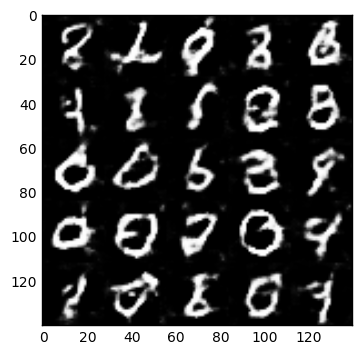

Epoch 2/2... Discriminator Loss: 0.7953... Generator Loss: 0.9252
Epoch 2/2... Discriminator Loss: 0.6906... Generator Loss: 1.2339
Epoch 2/2... Discriminator Loss: 0.7890... Generator Loss: 0.8833
Epoch 2/2... Discriminator Loss: 0.8131... Generator Loss: 0.9738
Epoch 2/2... Discriminator Loss: 0.8715... Generator Loss: 2.4329
Epoch 2/2... Discriminator Loss: 0.5786... Generator Loss: 1.6697
Epoch 2/2... Discriminator Loss: 0.8825... Generator Loss: 2.3273
Epoch 2/2... Discriminator Loss: 0.6936... Generator Loss: 1.0304
Epoch 2/2... Discriminator Loss: 0.7111... Generator Loss: 1.0493
Epoch 2/2... Discriminator Loss: 0.6457... Generator Loss: 1.2143


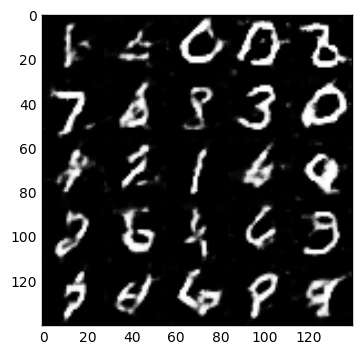

Epoch 2/2... Discriminator Loss: 1.0857... Generator Loss: 2.4570
Epoch 2/2... Discriminator Loss: 0.6568... Generator Loss: 1.9880
Epoch 2/2... Discriminator Loss: 0.6945... Generator Loss: 1.1111
Epoch 2/2... Discriminator Loss: 0.7725... Generator Loss: 0.9395
Epoch 2/2... Discriminator Loss: 0.7068... Generator Loss: 2.4025
Epoch 2/2... Discriminator Loss: 0.7969... Generator Loss: 0.9366
Epoch 2/2... Discriminator Loss: 0.7734... Generator Loss: 0.9787
Epoch 2/2... Discriminator Loss: 0.6716... Generator Loss: 1.4863
Epoch 2/2... Discriminator Loss: 0.7163... Generator Loss: 0.9982
Epoch 2/2... Discriminator Loss: 0.7404... Generator Loss: 2.5046


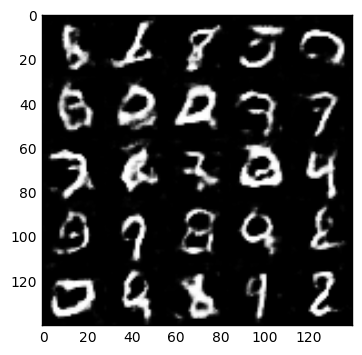

Epoch 2/2... Discriminator Loss: 0.6796... Generator Loss: 1.0870
Epoch 2/2... Discriminator Loss: 0.7331... Generator Loss: 1.8459
Epoch 2/2... Discriminator Loss: 0.5924... Generator Loss: 1.3002
Epoch 2/2... Discriminator Loss: 0.7216... Generator Loss: 2.1452
Epoch 2/2... Discriminator Loss: 0.6700... Generator Loss: 1.7361
Epoch 2/2... Discriminator Loss: 1.0711... Generator Loss: 0.5601
Epoch 2/2... Discriminator Loss: 0.5883... Generator Loss: 1.3735
Epoch 2/2... Discriminator Loss: 1.8491... Generator Loss: 4.0274
Epoch 2/2... Discriminator Loss: 0.5518... Generator Loss: 1.8201
Epoch 2/2... Discriminator Loss: 0.6499... Generator Loss: 1.3605


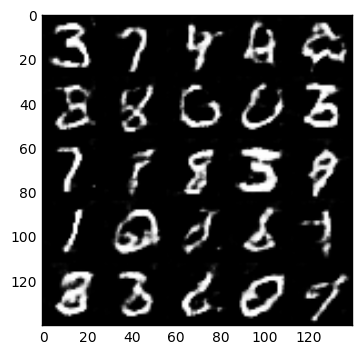

Epoch 2/2... Discriminator Loss: 0.9371... Generator Loss: 0.7169
Epoch 2/2... Discriminator Loss: 0.5936... Generator Loss: 1.1818
Epoch 2/2... Discriminator Loss: 0.7528... Generator Loss: 0.8626
Epoch 2/2... Discriminator Loss: 0.5209... Generator Loss: 1.4151
Epoch 2/2... Discriminator Loss: 0.6530... Generator Loss: 1.0531
Epoch 2/2... Discriminator Loss: 0.9390... Generator Loss: 1.1303
Epoch 2/2... Discriminator Loss: 1.0154... Generator Loss: 0.6726
Epoch 2/2... Discriminator Loss: 0.8275... Generator Loss: 0.8872
Epoch 2/2... Discriminator Loss: 0.6792... Generator Loss: 2.7527
Epoch 2/2... Discriminator Loss: 0.7556... Generator Loss: 0.9960


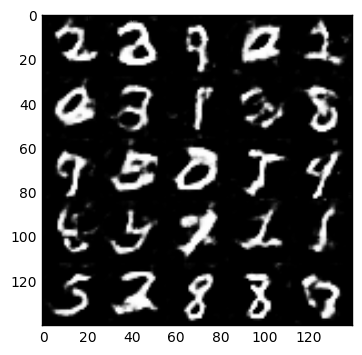

Epoch 2/2... Discriminator Loss: 0.6438... Generator Loss: 1.2207
Epoch 2/2... Discriminator Loss: 0.4692... Generator Loss: 1.6982
Epoch 2/2... Discriminator Loss: 0.5348... Generator Loss: 1.1987
Epoch 2/2... Discriminator Loss: 0.7176... Generator Loss: 0.9322
Epoch 2/2... Discriminator Loss: 0.4654... Generator Loss: 1.6590
Epoch 2/2... Discriminator Loss: 0.4644... Generator Loss: 1.8699
Epoch 2/2... Discriminator Loss: 0.6708... Generator Loss: 0.9808
Epoch 2/2... Discriminator Loss: 0.4183... Generator Loss: 1.6125
Epoch 2/2... Discriminator Loss: 0.4704... Generator Loss: 1.6648
Epoch 2/2... Discriminator Loss: 6.3704... Generator Loss: 0.0045


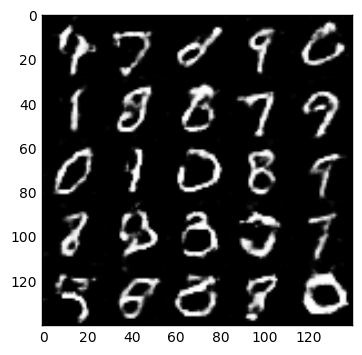

Epoch 2/2... Discriminator Loss: 0.7350... Generator Loss: 0.9736
Epoch 2/2... Discriminator Loss: 0.6706... Generator Loss: 0.9997
Epoch 2/2... Discriminator Loss: 0.5107... Generator Loss: 1.6901
Epoch 2/2... Discriminator Loss: 0.6210... Generator Loss: 1.1303
Epoch 2/2... Discriminator Loss: 0.3398... Generator Loss: 1.6783
Epoch 2/2... Discriminator Loss: 0.5209... Generator Loss: 1.5299
Epoch 2/2... Discriminator Loss: 0.7517... Generator Loss: 0.8883
Epoch 2/2... Discriminator Loss: 1.2998... Generator Loss: 3.0364
Epoch 2/2... Discriminator Loss: 1.1202... Generator Loss: 0.5394
Epoch 2/2... Discriminator Loss: 0.6593... Generator Loss: 1.0855


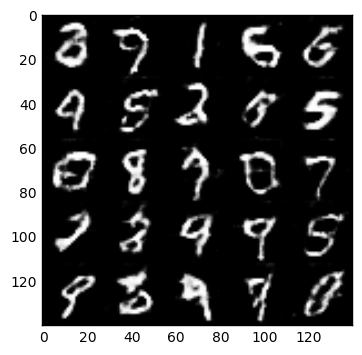

Epoch 2/2... Discriminator Loss: 0.7852... Generator Loss: 0.8334
Epoch 2/2... Discriminator Loss: 0.7528... Generator Loss: 0.8859
Epoch 2/2... Discriminator Loss: 0.7430... Generator Loss: 0.9157
Epoch 2/2... Discriminator Loss: 0.7710... Generator Loss: 0.8475
Epoch 2/2... Discriminator Loss: 0.6004... Generator Loss: 1.3825
Epoch 2/2... Discriminator Loss: 0.8930... Generator Loss: 1.0028
Epoch 2/2... Discriminator Loss: 0.5197... Generator Loss: 1.8365


In [38]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.2859... Generator Loss: 4.5628
Epoch 1/1... Discriminator Loss: 0.7435... Generator Loss: 10.1672
Epoch 1/1... Discriminator Loss: 0.4476... Generator Loss: 5.3050
Epoch 1/1... Discriminator Loss: 0.2673... Generator Loss: 7.5512
Epoch 1/1... Discriminator Loss: 0.1165... Generator Loss: 4.0815
Epoch 1/1... Discriminator Loss: 0.5617... Generator Loss: 1.6093
Epoch 1/1... Discriminator Loss: 0.5478... Generator Loss: 1.9576
Epoch 1/1... Discriminator Loss: 0.3801... Generator Loss: 3.7655
Epoch 1/1... Discriminator Loss: 0.7662... Generator Loss: 0.9399
Epoch 1/1... Discriminator Loss: 0.6562... Generator Loss: 6.7519


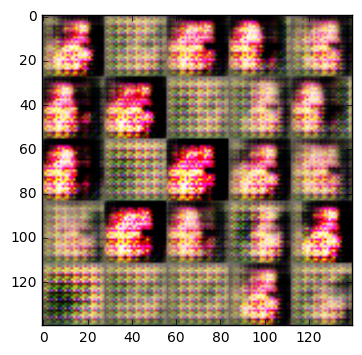

Epoch 1/1... Discriminator Loss: 0.4626... Generator Loss: 1.6273
Epoch 1/1... Discriminator Loss: 0.3794... Generator Loss: 2.8021
Epoch 1/1... Discriminator Loss: 0.8243... Generator Loss: 1.3818
Epoch 1/1... Discriminator Loss: 0.7911... Generator Loss: 1.5542
Epoch 1/1... Discriminator Loss: 0.3502... Generator Loss: 2.6787
Epoch 1/1... Discriminator Loss: 1.8693... Generator Loss: 7.1247
Epoch 1/1... Discriminator Loss: 0.5122... Generator Loss: 2.5313
Epoch 1/1... Discriminator Loss: 0.1695... Generator Loss: 2.7526
Epoch 1/1... Discriminator Loss: 0.4415... Generator Loss: 2.3322
Epoch 1/1... Discriminator Loss: 0.3244... Generator Loss: 2.7187


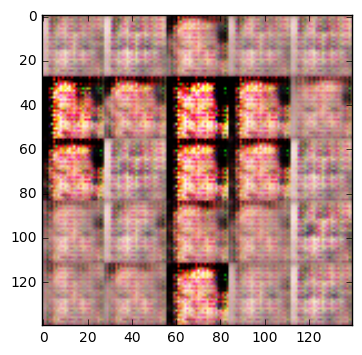

Epoch 1/1... Discriminator Loss: 0.4623... Generator Loss: 1.3215
Epoch 1/1... Discriminator Loss: 2.7696... Generator Loss: 4.3090
Epoch 1/1... Discriminator Loss: 0.7991... Generator Loss: 1.8427
Epoch 1/1... Discriminator Loss: 0.7556... Generator Loss: 1.4453
Epoch 1/1... Discriminator Loss: 0.5176... Generator Loss: 1.5578
Epoch 1/1... Discriminator Loss: 0.8444... Generator Loss: 2.0756
Epoch 1/1... Discriminator Loss: 1.6246... Generator Loss: 0.3635
Epoch 1/1... Discriminator Loss: 1.1366... Generator Loss: 0.9718
Epoch 1/1... Discriminator Loss: 0.9684... Generator Loss: 0.8215
Epoch 1/1... Discriminator Loss: 0.6938... Generator Loss: 1.5237


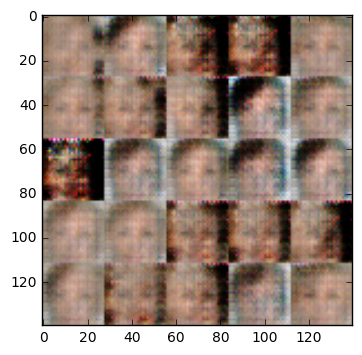

Epoch 1/1... Discriminator Loss: 1.5610... Generator Loss: 2.2639
Epoch 1/1... Discriminator Loss: 1.2901... Generator Loss: 0.4599
Epoch 1/1... Discriminator Loss: 0.8601... Generator Loss: 0.9611
Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 0.6067
Epoch 1/1... Discriminator Loss: 0.8325... Generator Loss: 2.4975
Epoch 1/1... Discriminator Loss: 1.0334... Generator Loss: 1.3895
Epoch 1/1... Discriminator Loss: 2.0094... Generator Loss: 0.2815
Epoch 1/1... Discriminator Loss: 0.8434... Generator Loss: 1.0566
Epoch 1/1... Discriminator Loss: 1.5917... Generator Loss: 0.2866
Epoch 1/1... Discriminator Loss: 1.0388... Generator Loss: 0.6489


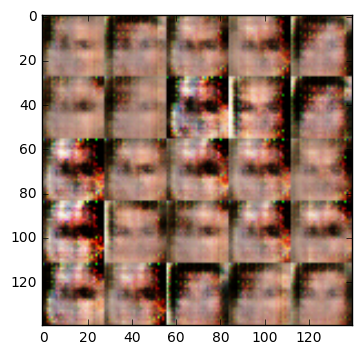

Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.5141
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.4461
Epoch 1/1... Discriminator Loss: 0.7585... Generator Loss: 0.9664
Epoch 1/1... Discriminator Loss: 0.9502... Generator Loss: 1.3692
Epoch 1/1... Discriminator Loss: 0.9904... Generator Loss: 0.8025
Epoch 1/1... Discriminator Loss: 1.1491... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.1844... Generator Loss: 0.5317
Epoch 1/1... Discriminator Loss: 0.9766... Generator Loss: 1.2737
Epoch 1/1... Discriminator Loss: 2.7963... Generator Loss: 3.7638
Epoch 1/1... Discriminator Loss: 1.0078... Generator Loss: 1.2812


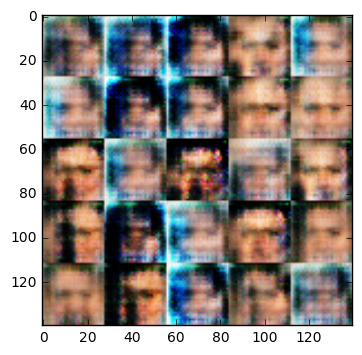

Epoch 1/1... Discriminator Loss: 1.6715... Generator Loss: 0.3352
Epoch 1/1... Discriminator Loss: 1.9167... Generator Loss: 0.2786
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.6312
Epoch 1/1... Discriminator Loss: 0.6896... Generator Loss: 1.5173
Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.6985
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.6680
Epoch 1/1... Discriminator Loss: 0.9490... Generator Loss: 1.1253
Epoch 1/1... Discriminator Loss: 1.3982... Generator Loss: 0.4195
Epoch 1/1... Discriminator Loss: 0.7838... Generator Loss: 1.0726
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 1.1050


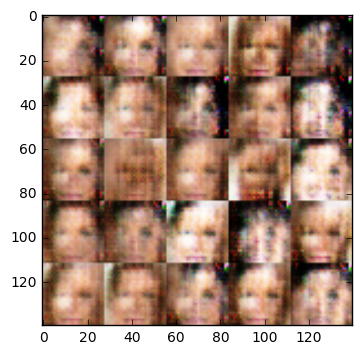

Epoch 1/1... Discriminator Loss: 2.3640... Generator Loss: 3.7404
Epoch 1/1... Discriminator Loss: 1.1351... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 0.8944... Generator Loss: 1.4107
Epoch 1/1... Discriminator Loss: 1.2731... Generator Loss: 0.5704
Epoch 1/1... Discriminator Loss: 0.7099... Generator Loss: 1.1157
Epoch 1/1... Discriminator Loss: 1.0726... Generator Loss: 0.8542
Epoch 1/1... Discriminator Loss: 1.0442... Generator Loss: 0.8716
Epoch 1/1... Discriminator Loss: 1.0383... Generator Loss: 1.0153
Epoch 1/1... Discriminator Loss: 1.0681... Generator Loss: 1.8772
Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.6386


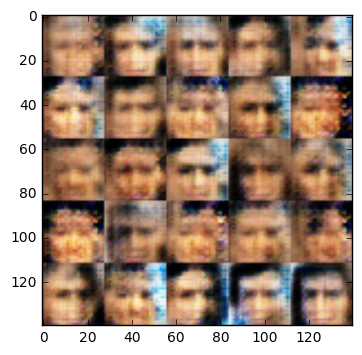

Epoch 1/1... Discriminator Loss: 1.1465... Generator Loss: 0.7197
Epoch 1/1... Discriminator Loss: 0.6773... Generator Loss: 1.4193
Epoch 1/1... Discriminator Loss: 0.8777... Generator Loss: 1.5909
Epoch 1/1... Discriminator Loss: 1.2148... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.5344... Generator Loss: 1.9703
Epoch 1/1... Discriminator Loss: 0.9678... Generator Loss: 1.4059
Epoch 1/1... Discriminator Loss: 1.0088... Generator Loss: 1.5360
Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 1.7463
Epoch 1/1... Discriminator Loss: 0.9716... Generator Loss: 0.6863
Epoch 1/1... Discriminator Loss: 0.7810... Generator Loss: 2.1861


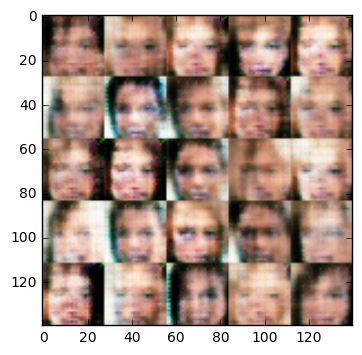

Epoch 1/1... Discriminator Loss: 0.7515... Generator Loss: 1.4862
Epoch 1/1... Discriminator Loss: 0.8306... Generator Loss: 2.3649
Epoch 1/1... Discriminator Loss: 1.8454... Generator Loss: 0.3049
Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.8741... Generator Loss: 2.7197
Epoch 1/1... Discriminator Loss: 1.0973... Generator Loss: 1.1730
Epoch 1/1... Discriminator Loss: 1.0115... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 0.8340... Generator Loss: 1.7624
Epoch 1/1... Discriminator Loss: 1.0822... Generator Loss: 1.4078
Epoch 1/1... Discriminator Loss: 1.0645... Generator Loss: 0.6535


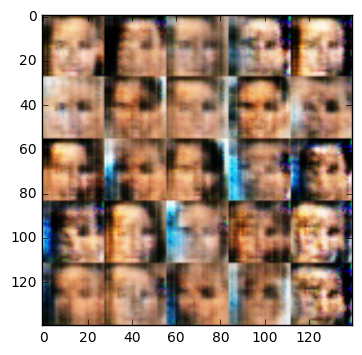

Epoch 1/1... Discriminator Loss: 2.0487... Generator Loss: 3.4897
Epoch 1/1... Discriminator Loss: 1.1668... Generator Loss: 0.8294
Epoch 1/1... Discriminator Loss: 1.2091... Generator Loss: 0.8613
Epoch 1/1... Discriminator Loss: 0.7216... Generator Loss: 1.2696
Epoch 1/1... Discriminator Loss: 0.9375... Generator Loss: 1.2927
Epoch 1/1... Discriminator Loss: 1.8303... Generator Loss: 2.5252
Epoch 1/1... Discriminator Loss: 1.2109... Generator Loss: 0.8011
Epoch 1/1... Discriminator Loss: 1.5197... Generator Loss: 0.5382
Epoch 1/1... Discriminator Loss: 1.3527... Generator Loss: 1.3842
Epoch 1/1... Discriminator Loss: 0.9195... Generator Loss: 1.4924


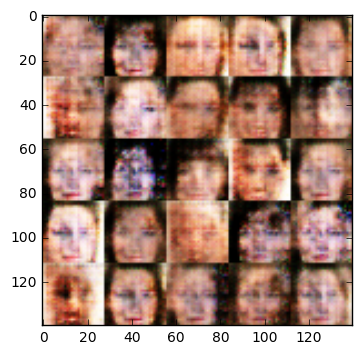

Epoch 1/1... Discriminator Loss: 1.3220... Generator Loss: 0.6023
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 0.5713
Epoch 1/1... Discriminator Loss: 0.9664... Generator Loss: 2.0628
Epoch 1/1... Discriminator Loss: 1.0881... Generator Loss: 1.6748
Epoch 1/1... Discriminator Loss: 1.0530... Generator Loss: 1.5870
Epoch 1/1... Discriminator Loss: 0.9139... Generator Loss: 1.4003
Epoch 1/1... Discriminator Loss: 1.5124... Generator Loss: 1.9279
Epoch 1/1... Discriminator Loss: 0.9606... Generator Loss: 0.9249
Epoch 1/1... Discriminator Loss: 1.1188... Generator Loss: 0.8270
Epoch 1/1... Discriminator Loss: 1.4996... Generator Loss: 2.6815


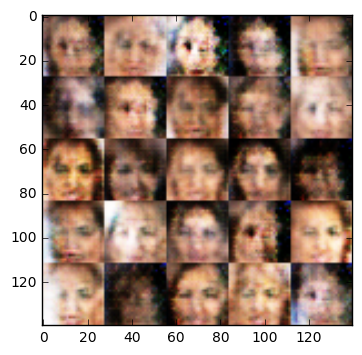

Epoch 1/1... Discriminator Loss: 1.1404... Generator Loss: 0.9690
Epoch 1/1... Discriminator Loss: 0.8394... Generator Loss: 1.4326
Epoch 1/1... Discriminator Loss: 2.2998... Generator Loss: 0.1612
Epoch 1/1... Discriminator Loss: 1.1207... Generator Loss: 0.8617
Epoch 1/1... Discriminator Loss: 1.0455... Generator Loss: 2.1890
Epoch 1/1... Discriminator Loss: 1.1638... Generator Loss: 0.6284
Epoch 1/1... Discriminator Loss: 0.9434... Generator Loss: 0.7314
Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 1.2702
Epoch 1/1... Discriminator Loss: 1.2867... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.2123... Generator Loss: 0.5988


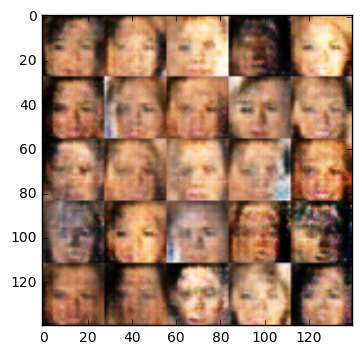

Epoch 1/1... Discriminator Loss: 0.8547... Generator Loss: 1.2719
Epoch 1/1... Discriminator Loss: 0.7434... Generator Loss: 1.2795
Epoch 1/1... Discriminator Loss: 1.2389... Generator Loss: 0.5726
Epoch 1/1... Discriminator Loss: 1.1219... Generator Loss: 1.0485
Epoch 1/1... Discriminator Loss: 0.9978... Generator Loss: 1.5642
Epoch 1/1... Discriminator Loss: 0.8381... Generator Loss: 1.0124
Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.4215
Epoch 1/1... Discriminator Loss: 1.5898... Generator Loss: 2.8520
Epoch 1/1... Discriminator Loss: 1.6082... Generator Loss: 0.3525
Epoch 1/1... Discriminator Loss: 1.1017... Generator Loss: 0.5963


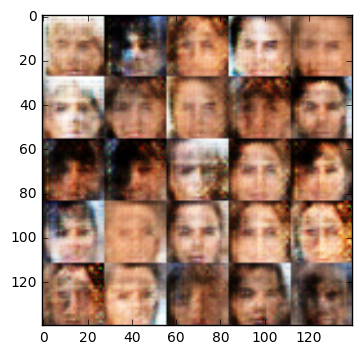

Epoch 1/1... Discriminator Loss: 1.0727... Generator Loss: 0.7934
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.6546
Epoch 1/1... Discriminator Loss: 0.7728... Generator Loss: 1.2983
Epoch 1/1... Discriminator Loss: 0.8397... Generator Loss: 1.5489
Epoch 1/1... Discriminator Loss: 1.1038... Generator Loss: 2.1281
Epoch 1/1... Discriminator Loss: 0.9421... Generator Loss: 1.8531
Epoch 1/1... Discriminator Loss: 0.8947... Generator Loss: 0.9503
Epoch 1/1... Discriminator Loss: 1.2188... Generator Loss: 2.4378
Epoch 1/1... Discriminator Loss: 1.1163... Generator Loss: 0.9354
Epoch 1/1... Discriminator Loss: 0.8880... Generator Loss: 1.1767


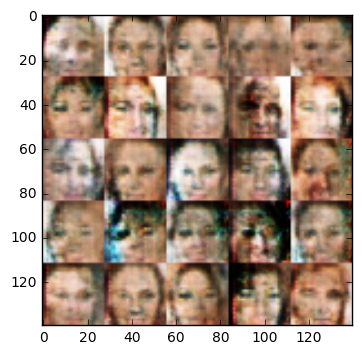

Epoch 1/1... Discriminator Loss: 0.9884... Generator Loss: 1.3250
Epoch 1/1... Discriminator Loss: 1.1112... Generator Loss: 1.0979
Epoch 1/1... Discriminator Loss: 0.8238... Generator Loss: 1.5563
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.6427
Epoch 1/1... Discriminator Loss: 0.9597... Generator Loss: 1.5040
Epoch 1/1... Discriminator Loss: 1.1535... Generator Loss: 0.6898
Epoch 1/1... Discriminator Loss: 1.3775... Generator Loss: 0.4730
Epoch 1/1... Discriminator Loss: 1.0041... Generator Loss: 1.9134
Epoch 1/1... Discriminator Loss: 0.8634... Generator Loss: 1.2480
Epoch 1/1... Discriminator Loss: 0.9686... Generator Loss: 1.0754


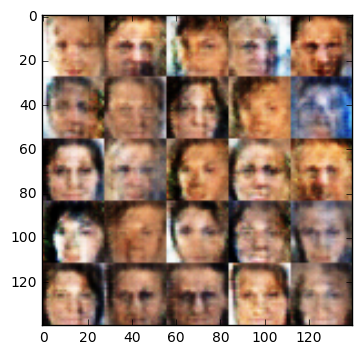

Epoch 1/1... Discriminator Loss: 0.9240... Generator Loss: 0.9335
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.6852
Epoch 1/1... Discriminator Loss: 1.0359... Generator Loss: 1.1015
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.6642
Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 2.0933
Epoch 1/1... Discriminator Loss: 0.9640... Generator Loss: 1.0110
Epoch 1/1... Discriminator Loss: 0.9593... Generator Loss: 1.3771
Epoch 1/1... Discriminator Loss: 1.0523... Generator Loss: 0.6774
Epoch 1/1... Discriminator Loss: 0.9206... Generator Loss: 0.9448
Epoch 1/1... Discriminator Loss: 0.8859... Generator Loss: 1.0433


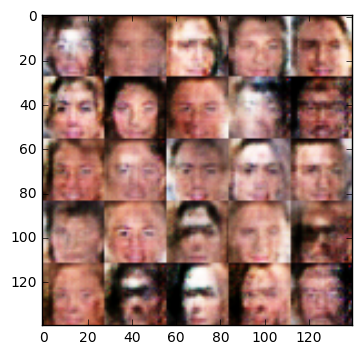

Epoch 1/1... Discriminator Loss: 1.1208... Generator Loss: 0.7999
Epoch 1/1... Discriminator Loss: 1.0390... Generator Loss: 1.4049
Epoch 1/1... Discriminator Loss: 1.1960... Generator Loss: 1.0157
Epoch 1/1... Discriminator Loss: 1.1557... Generator Loss: 2.1390
Epoch 1/1... Discriminator Loss: 1.1144... Generator Loss: 0.6867
Epoch 1/1... Discriminator Loss: 0.8218... Generator Loss: 1.3745
Epoch 1/1... Discriminator Loss: 1.0411... Generator Loss: 1.3307
Epoch 1/1... Discriminator Loss: 1.3145... Generator Loss: 0.5490
Epoch 1/1... Discriminator Loss: 0.9819... Generator Loss: 1.1718
Epoch 1/1... Discriminator Loss: 1.0207... Generator Loss: 1.2727


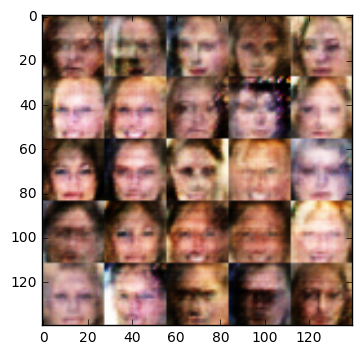

Epoch 1/1... Discriminator Loss: 1.0423... Generator Loss: 1.0725
Epoch 1/1... Discriminator Loss: 1.1490... Generator Loss: 1.2561
Epoch 1/1... Discriminator Loss: 0.8171... Generator Loss: 1.0131
Epoch 1/1... Discriminator Loss: 0.8918... Generator Loss: 1.3754
Epoch 1/1... Discriminator Loss: 0.9506... Generator Loss: 1.3495
Epoch 1/1... Discriminator Loss: 0.9143... Generator Loss: 1.0051
Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.5404
Epoch 1/1... Discriminator Loss: 0.9117... Generator Loss: 0.9246
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.6300
Epoch 1/1... Discriminator Loss: 1.2034... Generator Loss: 0.6619


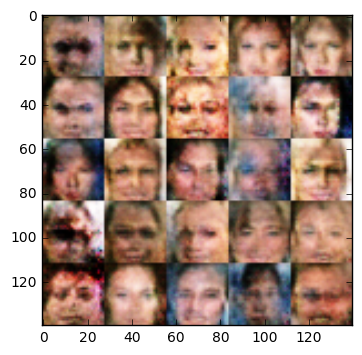

Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 0.4561
Epoch 1/1... Discriminator Loss: 1.2138... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.0871... Generator Loss: 1.3998
Epoch 1/1... Discriminator Loss: 1.0844... Generator Loss: 0.9530
Epoch 1/1... Discriminator Loss: 1.1553... Generator Loss: 0.8188
Epoch 1/1... Discriminator Loss: 0.9002... Generator Loss: 1.3149
Epoch 1/1... Discriminator Loss: 0.9507... Generator Loss: 1.2005
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 0.5674
Epoch 1/1... Discriminator Loss: 1.1263... Generator Loss: 1.5114
Epoch 1/1... Discriminator Loss: 1.0582... Generator Loss: 1.7667


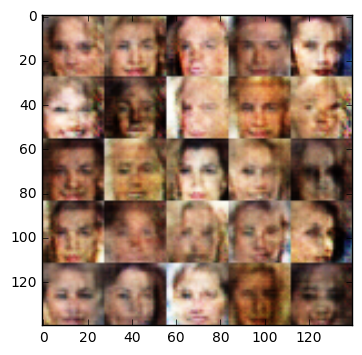

Epoch 1/1... Discriminator Loss: 0.9152... Generator Loss: 1.4782
Epoch 1/1... Discriminator Loss: 0.9073... Generator Loss: 1.0066
Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 0.6155
Epoch 1/1... Discriminator Loss: 1.1997... Generator Loss: 0.6012
Epoch 1/1... Discriminator Loss: 1.0716... Generator Loss: 0.8569
Epoch 1/1... Discriminator Loss: 1.2114... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.4460... Generator Loss: 0.5768
Epoch 1/1... Discriminator Loss: 1.0517... Generator Loss: 1.5273
Epoch 1/1... Discriminator Loss: 1.6356... Generator Loss: 0.2889
Epoch 1/1... Discriminator Loss: 1.2018... Generator Loss: 0.6668


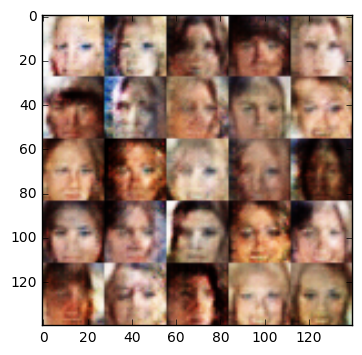

Epoch 1/1... Discriminator Loss: 0.9917... Generator Loss: 0.8654
Epoch 1/1... Discriminator Loss: 0.9021... Generator Loss: 1.6531
Epoch 1/1... Discriminator Loss: 0.9230... Generator Loss: 1.1021
Epoch 1/1... Discriminator Loss: 1.3130... Generator Loss: 0.4551
Epoch 1/1... Discriminator Loss: 1.1874... Generator Loss: 0.6624
Epoch 1/1... Discriminator Loss: 0.8710... Generator Loss: 1.3111
Epoch 1/1... Discriminator Loss: 1.0960... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.0484... Generator Loss: 1.0675
Epoch 1/1... Discriminator Loss: 0.9823... Generator Loss: 1.2136
Epoch 1/1... Discriminator Loss: 0.9393... Generator Loss: 1.5570


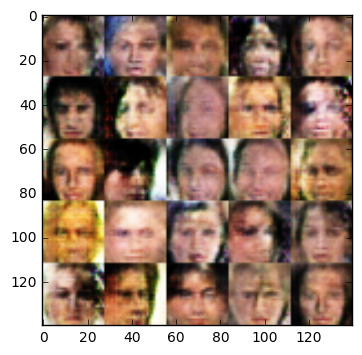

Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 2.0084
Epoch 1/1... Discriminator Loss: 1.1547... Generator Loss: 0.5792
Epoch 1/1... Discriminator Loss: 1.0136... Generator Loss: 1.2229
Epoch 1/1... Discriminator Loss: 1.1784... Generator Loss: 0.7890
Epoch 1/1... Discriminator Loss: 1.0995... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 0.5902
Epoch 1/1... Discriminator Loss: 0.8929... Generator Loss: 1.3247
Epoch 1/1... Discriminator Loss: 1.0096... Generator Loss: 1.4247
Epoch 1/1... Discriminator Loss: 1.0396... Generator Loss: 0.8244
Epoch 1/1... Discriminator Loss: 1.1730... Generator Loss: 0.8854


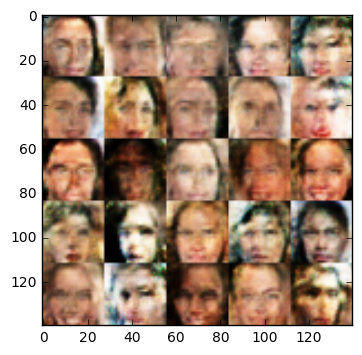

Epoch 1/1... Discriminator Loss: 1.2468... Generator Loss: 0.8454
Epoch 1/1... Discriminator Loss: 1.0890... Generator Loss: 0.7573
Epoch 1/1... Discriminator Loss: 1.0497... Generator Loss: 0.8847
Epoch 1/1... Discriminator Loss: 1.1134... Generator Loss: 0.8479
Epoch 1/1... Discriminator Loss: 1.1249... Generator Loss: 1.0157
Epoch 1/1... Discriminator Loss: 1.0950... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 0.8581... Generator Loss: 0.8918
Epoch 1/1... Discriminator Loss: 0.7550... Generator Loss: 1.2725
Epoch 1/1... Discriminator Loss: 1.1173... Generator Loss: 1.2687
Epoch 1/1... Discriminator Loss: 1.1058... Generator Loss: 0.7486


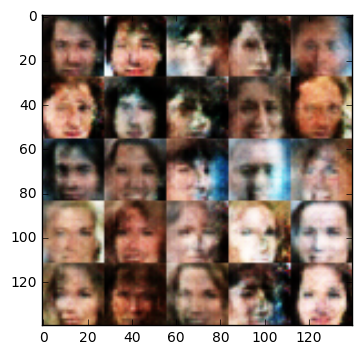

Epoch 1/1... Discriminator Loss: 0.9696... Generator Loss: 1.3371
Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.4840
Epoch 1/1... Discriminator Loss: 0.7907... Generator Loss: 1.4046
Epoch 1/1... Discriminator Loss: 1.6124... Generator Loss: 1.3890
Epoch 1/1... Discriminator Loss: 1.0955... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 1.2027... Generator Loss: 0.5142
Epoch 1/1... Discriminator Loss: 1.0734... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 0.9539... Generator Loss: 1.8898
Epoch 1/1... Discriminator Loss: 1.1197... Generator Loss: 1.5050


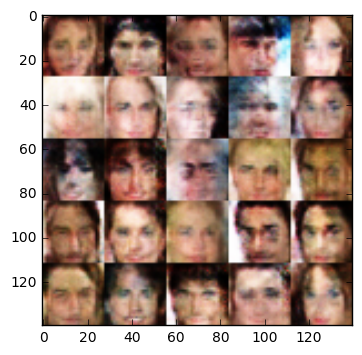

Epoch 1/1... Discriminator Loss: 1.1068... Generator Loss: 0.7919
Epoch 1/1... Discriminator Loss: 0.8890... Generator Loss: 0.9250
Epoch 1/1... Discriminator Loss: 1.1422... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 0.9719... Generator Loss: 0.8112
Epoch 1/1... Discriminator Loss: 1.3166... Generator Loss: 0.5413
Epoch 1/1... Discriminator Loss: 1.2490... Generator Loss: 0.6324
Epoch 1/1... Discriminator Loss: 1.1952... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.1114... Generator Loss: 0.7047
Epoch 1/1... Discriminator Loss: 1.3343... Generator Loss: 0.4857
Epoch 1/1... Discriminator Loss: 1.0459... Generator Loss: 1.1257


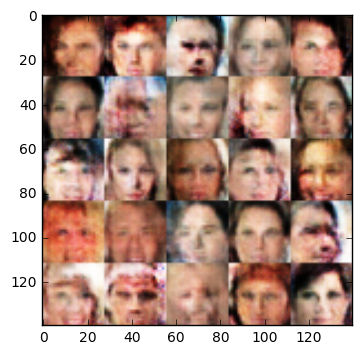

Epoch 1/1... Discriminator Loss: 1.0140... Generator Loss: 1.2319
Epoch 1/1... Discriminator Loss: 1.2184... Generator Loss: 0.6123
Epoch 1/1... Discriminator Loss: 1.1459... Generator Loss: 0.8573
Epoch 1/1... Discriminator Loss: 0.9490... Generator Loss: 0.8316
Epoch 1/1... Discriminator Loss: 0.9775... Generator Loss: 0.9494
Epoch 1/1... Discriminator Loss: 1.3155... Generator Loss: 0.6409
Epoch 1/1... Discriminator Loss: 1.6063... Generator Loss: 0.9462
Epoch 1/1... Discriminator Loss: 0.8285... Generator Loss: 0.9369
Epoch 1/1... Discriminator Loss: 1.0112... Generator Loss: 0.9819
Epoch 1/1... Discriminator Loss: 1.0284... Generator Loss: 0.7134


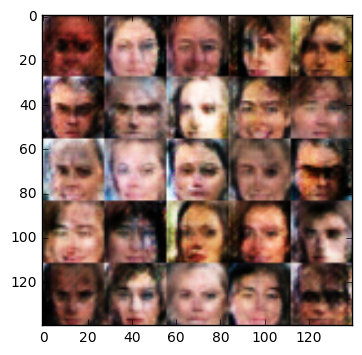

Epoch 1/1... Discriminator Loss: 1.1793... Generator Loss: 0.8147
Epoch 1/1... Discriminator Loss: 1.2331... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.0178... Generator Loss: 1.0606
Epoch 1/1... Discriminator Loss: 1.0225... Generator Loss: 1.6232
Epoch 1/1... Discriminator Loss: 1.2225... Generator Loss: 0.6603
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 2.1634
Epoch 1/1... Discriminator Loss: 0.9705... Generator Loss: 0.8204
Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 0.5686
Epoch 1/1... Discriminator Loss: 1.1492... Generator Loss: 1.1363
Epoch 1/1... Discriminator Loss: 1.0870... Generator Loss: 0.6379


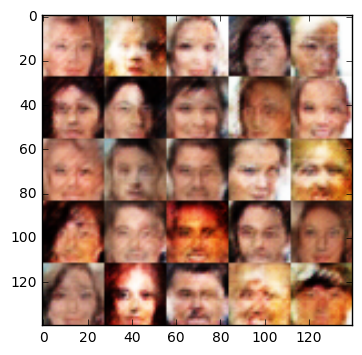

Epoch 1/1... Discriminator Loss: 1.4365... Generator Loss: 0.3934
Epoch 1/1... Discriminator Loss: 1.0856... Generator Loss: 0.8316
Epoch 1/1... Discriminator Loss: 1.1808... Generator Loss: 0.7755
Epoch 1/1... Discriminator Loss: 1.0125... Generator Loss: 1.4558
Epoch 1/1... Discriminator Loss: 1.0125... Generator Loss: 0.9920
Epoch 1/1... Discriminator Loss: 1.1375... Generator Loss: 1.1083
Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 1.5356
Epoch 1/1... Discriminator Loss: 0.9836... Generator Loss: 0.9334
Epoch 1/1... Discriminator Loss: 0.9976... Generator Loss: 0.9740
Epoch 1/1... Discriminator Loss: 1.0560... Generator Loss: 0.7089


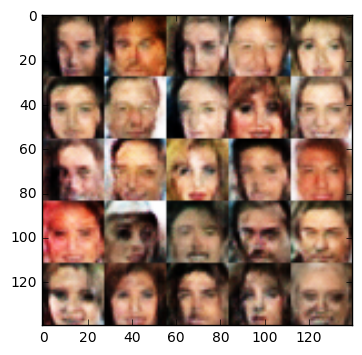

Epoch 1/1... Discriminator Loss: 1.0427... Generator Loss: 0.8357
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.8257
Epoch 1/1... Discriminator Loss: 1.0865... Generator Loss: 1.5422
Epoch 1/1... Discriminator Loss: 1.2697... Generator Loss: 1.8509
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 0.5935
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.4691
Epoch 1/1... Discriminator Loss: 0.9155... Generator Loss: 0.8858
Epoch 1/1... Discriminator Loss: 1.0112... Generator Loss: 1.0030
Epoch 1/1... Discriminator Loss: 0.9352... Generator Loss: 0.8485
Epoch 1/1... Discriminator Loss: 1.2209... Generator Loss: 0.5942


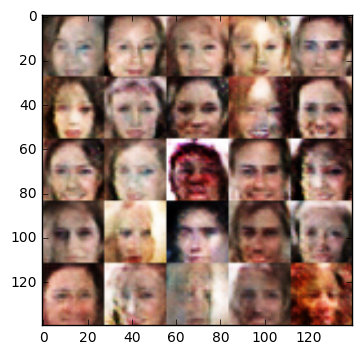

Epoch 1/1... Discriminator Loss: 1.1352... Generator Loss: 0.6378
Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 1.2668
Epoch 1/1... Discriminator Loss: 1.0113... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 0.9502... Generator Loss: 1.0026
Epoch 1/1... Discriminator Loss: 0.9502... Generator Loss: 1.7517
Epoch 1/1... Discriminator Loss: 1.0161... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.0895... Generator Loss: 1.3235
Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 0.7645
Epoch 1/1... Discriminator Loss: 1.0453... Generator Loss: 0.9836
Epoch 1/1... Discriminator Loss: 1.1626... Generator Loss: 1.3049


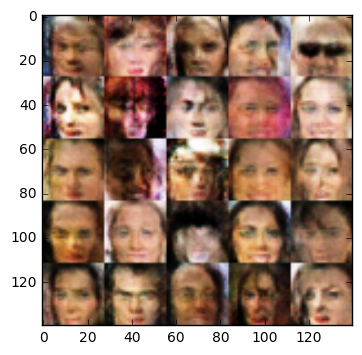

Epoch 1/1... Discriminator Loss: 1.2258... Generator Loss: 0.5667
Epoch 1/1... Discriminator Loss: 1.0229... Generator Loss: 0.9595
Epoch 1/1... Discriminator Loss: 1.1221... Generator Loss: 0.7859
Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 0.9868
Epoch 1/1... Discriminator Loss: 1.0545... Generator Loss: 0.7138
Epoch 1/1... Discriminator Loss: 1.0813... Generator Loss: 0.7340
Epoch 1/1... Discriminator Loss: 1.3179... Generator Loss: 0.5635
Epoch 1/1... Discriminator Loss: 1.0935... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.1326... Generator Loss: 0.6655
Epoch 1/1... Discriminator Loss: 0.8487... Generator Loss: 1.1686


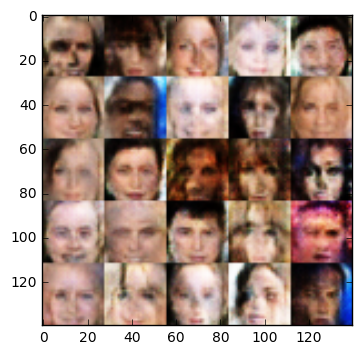

Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 0.9259... Generator Loss: 0.9599
Epoch 1/1... Discriminator Loss: 0.9656... Generator Loss: 0.9129
Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.5703
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 1.2623
Epoch 1/1... Discriminator Loss: 1.5872... Generator Loss: 0.3524


In [41]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.